## This is an attempt to implement the Linear Filtering
From section 3.2 of Computer Vision - Algorithms and Applications 2nd Edition, Richard Szeliski

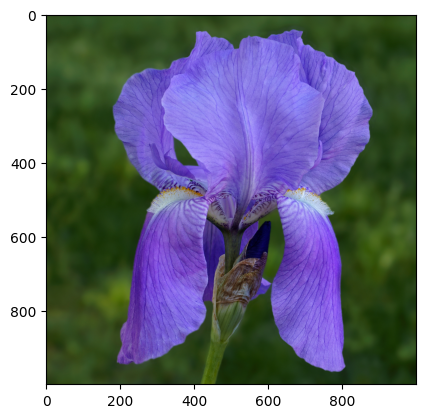

In [ ]:
# Load image Iris.jpg
import cv2
import numpy as np
import matplotlib.pyplot as plt
# Load the image
image = cv2.imread('dat/Iris.jpg')
# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# Display the image using matplotlib
plt.imshow(image_rgb)


### Tinkering with edge detection kernels

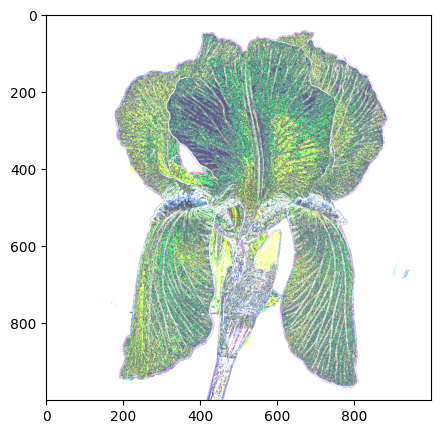

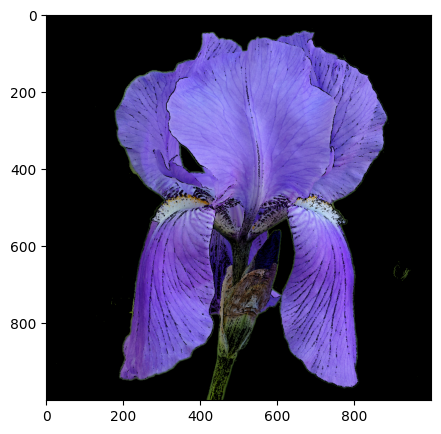

In [4]:
x = 2.05
y = 2
ker1 = np.array([[x, 0, -y],[x, 0, -y],[x, 0, -y]])
ker2 = np.array([[-y, 0, x],[-y, 0, x],[-y, 0, x]]) 
ker3 = np.array([[-y, -y, -y],[0, 0, 0],[x, x, x]])
ker4 = np.array([[x, x, x],[0, 0, 0],[-y, -y, -y]])
# Apply the kernel to the image using convolution
filtered_image1 = cv2.filter2D(image_rgb, -1, ker1)
filtered_image2 = cv2.filter2D(image_rgb, -1, ker2)
filtered_image3 = cv2.filter2D(image_rgb, -1, ker3)
filtered_image4 = cv2.filter2D(image_rgb, -1, ker4)
# Combine the two filtered images
filtered_image = cv2.add(filtered_image1, filtered_image2)
filtered_image = cv2.add(filtered_image, filtered_image3)
filtered_image = cv2.add(filtered_image, filtered_image4)
mean = np.mean(filtered_image, axis=(0, 1))
# make the pixels 0 if they are less than the mean
filtered_image[filtered_image < mean] = 255
# Display the filtered image
plt.figure(figsize=(10, 5))
plt.imshow(filtered_image)

new_image = np.zeros_like(image_rgb)
# set non-white pixels to 1
new_image[filtered_image < 255] = 1
# if any pixel has a value of 1 (any of r, g, b channels), set all channels to 1
new_image[(new_image == 1).any(axis=-1)] = 1
# multiply the new image with the original image
new_image = new_image * image_rgb
# Display the new image
plt.figure(figsize=(10, 5))
plt.imshow(new_image)

### Associativity of Convolution

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1560748..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1560748..1.0].


Maximum absolute difference between the two results: 188.0


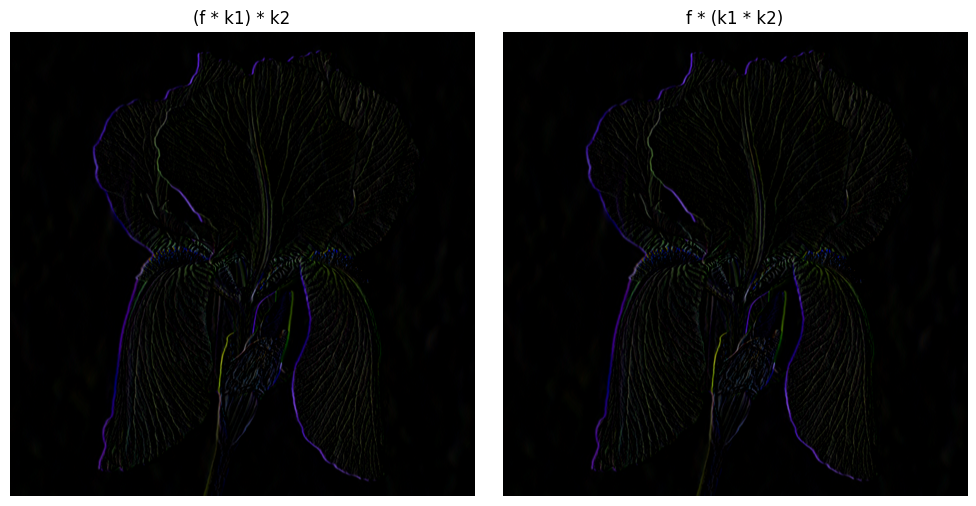

In [ ]:
# Define constants
x = 2
y = 2

# Define kernels
ker1 = np.array([[x, 0, -y], [x, 0, -y], [x, 0, -y]], dtype=np.float32)
ker2 = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]], dtype=np.float32)

# Flip kernels for convolution
k1_flipped = cv2.flip(ker1, -1)
k2_flipped = cv2.flip(ker2, -1)

# Create a sample image (replace with your own image as needed)
img = image_rgb.copy()  
img_float = img.astype(np.float32)

# Compute (f * k1) * k2
img_k1 = cv2.filter2D(img_float, -1, k1_flipped)
img_k1_k2 = cv2.filter2D(img_k1, -1, k2_flipped)

# Compute k1 * k2 using OpenCV functions
# Pad ker1 to 7x7 with ker1 centered, for full convolution resulting in 5x5
ker1_padded = np.zeros((7, 7), dtype=np.float32)
ker1_padded[2:5, 2:5] = ker1  # Place ker1 in the center
ker2_flipped = cv2.flip(ker2, -1)
ker3_full = cv2.filter2D(ker1_padded, -1, ker2_flipped, borderType=cv2.BORDER_CONSTANT)
# Extract the central 5x5 region, which is the full convolution of two 3x3 kernels
ker3 = ker3_full[1:6, 1:6]
ker3_flipped = cv2.flip(ker3, -1)

# Compute f * (k1 * k2)
img_ker3 = cv2.filter2D(img_float, -1, ker3_flipped)

# Normalize images to [0, 255] for display
def normalize_image(img):
    img_min = np.min(img)
    img_max = np.max(img)
    if img_max == img_min:
        return np.zeros_like(img, dtype=np.uint8)
    return ((img - img_min) / (img_max - img_min) * 255).astype(np.uint8)

img_k1_k2_norm = img_k1_k2 / np.max(img_k1_k2)
img_ker3_norm = img_ker3 / np.max(img_ker3)

# Display images side by side
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_k1_k2_norm)
plt.title('(f * k1) * k2')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(img_ker3_norm)
plt.title('f * (k1 * k2)')
plt.axis('off')
plt.tight_layout()
plt.savefig('results/convolution_comparison.png')

# Compute and print maximum difference
diff = np.abs(img_k1_k2 - img_ker3)
max_diff = np.max(diff)
print(f"Maximum absolute difference between the two results: {max_diff}")

### Blur


- we take large kernel since image dimensions are large

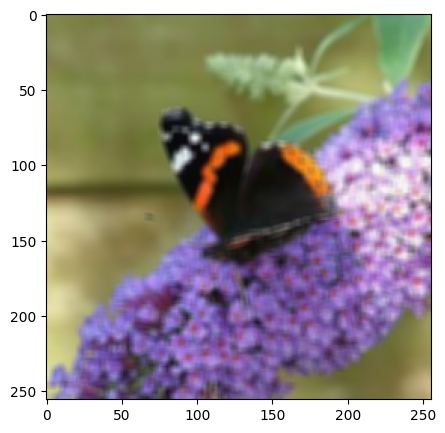

In [ ]:
img = cv2.imread('dat/491.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 20x20 kernel with all values set to 1
kerx = 5
kery = 5
ker = np.ones((kery, kerx), dtype=np.float32) / (kerx * kery)   

# Apply the kernel to the new image using convolution
blurred_image = cv2.filter2D(img, -1, ker)
plt.figure(figsize=(10, 5))
plt.imshow(blurred_image)

Maximum absolute difference between the two blurred images: 0


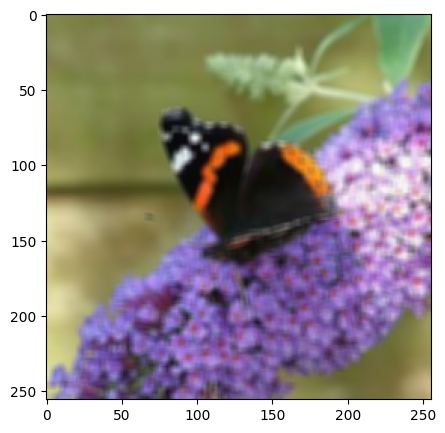

In [37]:
# we do SVD of ker and apply u1Sigma1v1T to the image
U, S, VT = np.linalg.svd(ker)
# Reconstruct the kernel using the first singular value and vectors
ker_svd = U[:, 0:1] @ np.diag(S[0:1]) @ VT[0:1, :]
# Apply the SVD kernel to the image using convolution
blurred_image_svd = cv2.filter2D(img, -1, ker_svd)
plt.figure(figsize=(10, 5))
plt.imshow(blurred_image_svd)

# compare the two blurred images
diff_blurred = np.abs(blurred_image - blurred_image_svd)
max_diff_blurred = np.max(diff_blurred)
print(f"Maximum absolute difference between the two blurred images: {max_diff_blurred}")

### Sharpening

**Formula** : $\text{g} = \text{f} - \gamma \cdot (\text{f} - \text{f} * \text{h})$



(np.float64(-0.5), np.float64(1199.5), np.float64(799.5), np.float64(-0.5))

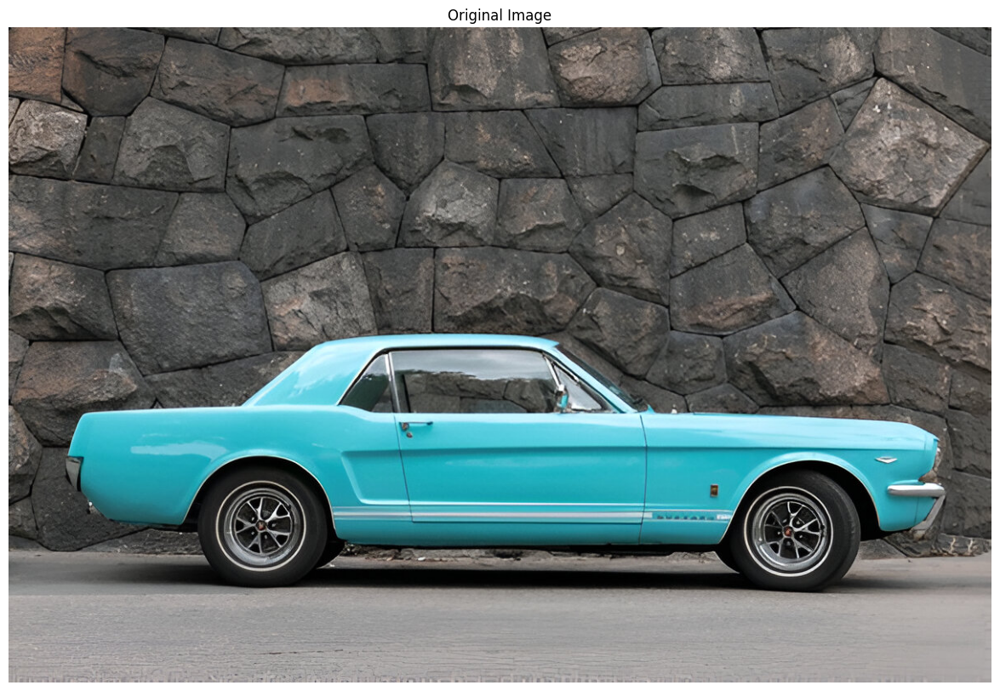

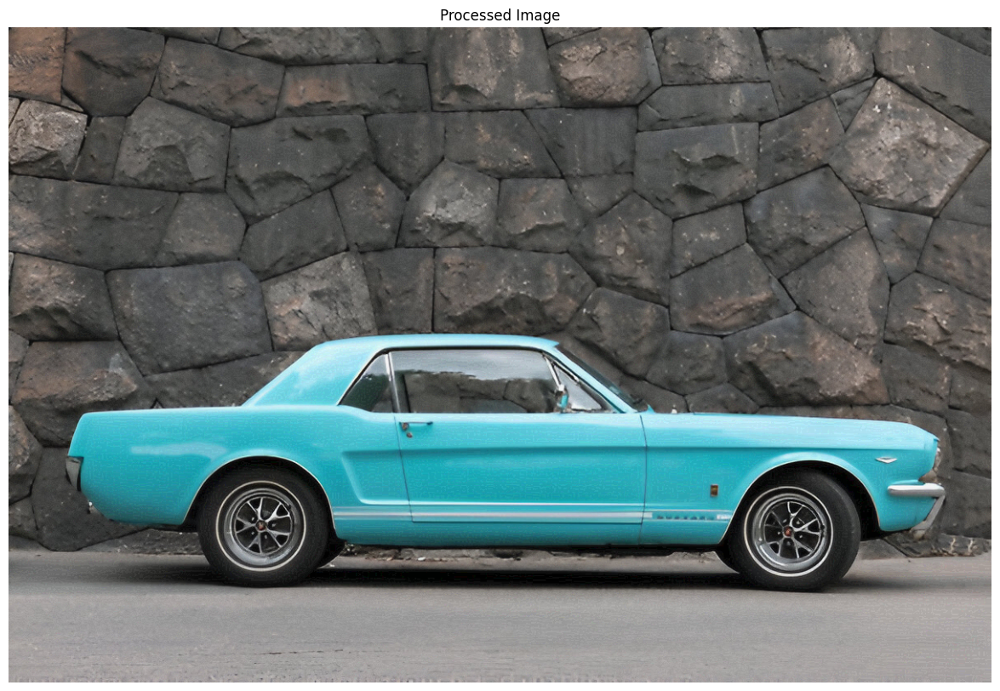

In [ ]:
img = cv2.imread('dat/car_sideview.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# use formula g = f + gamma * (f - f * h)
gamma = 0.05
h = np.ones((5, 5), dtype=np.float32) / 25 
blur = cv2.filter2D(img, -1, h)
g = img + gamma * (img - blur)
g = g / np.max(g) 
# Display the original and processed images
plt.figure(figsize=(20, 10))
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')
plt.figure(figsize=(20, 10))
plt.imshow(g)
plt.title('Processed Image')
plt.axis('off')

**Formula** : $\text{g} = \text{f} \cdot (1 - \gamma \cdot \text{h} * \text{f})$

(np.float64(-0.5), np.float64(1199.5), np.float64(799.5), np.float64(-0.5))

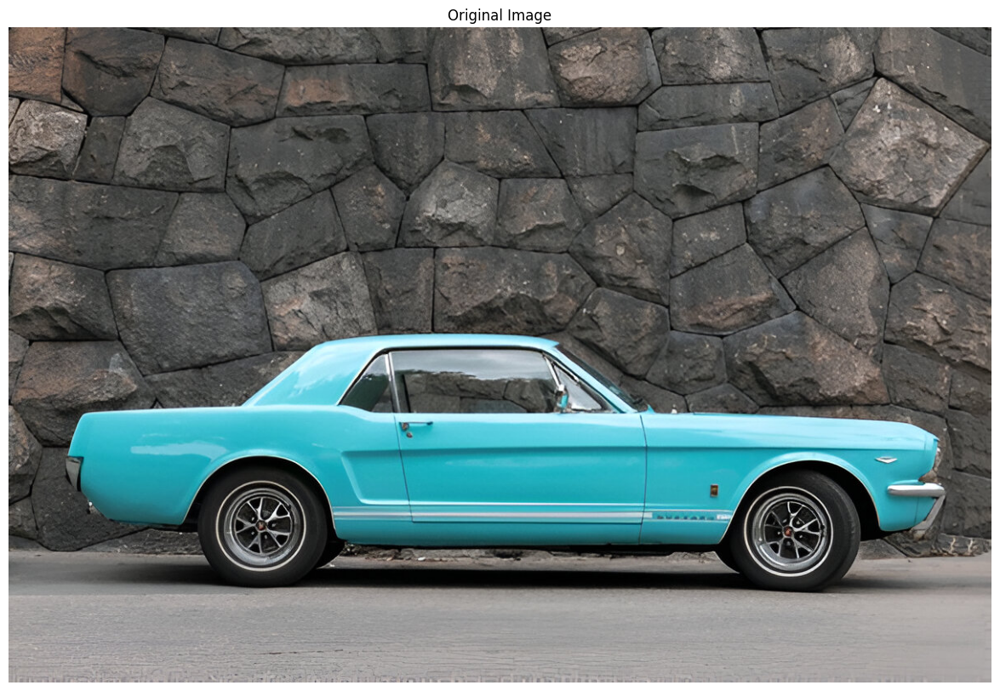

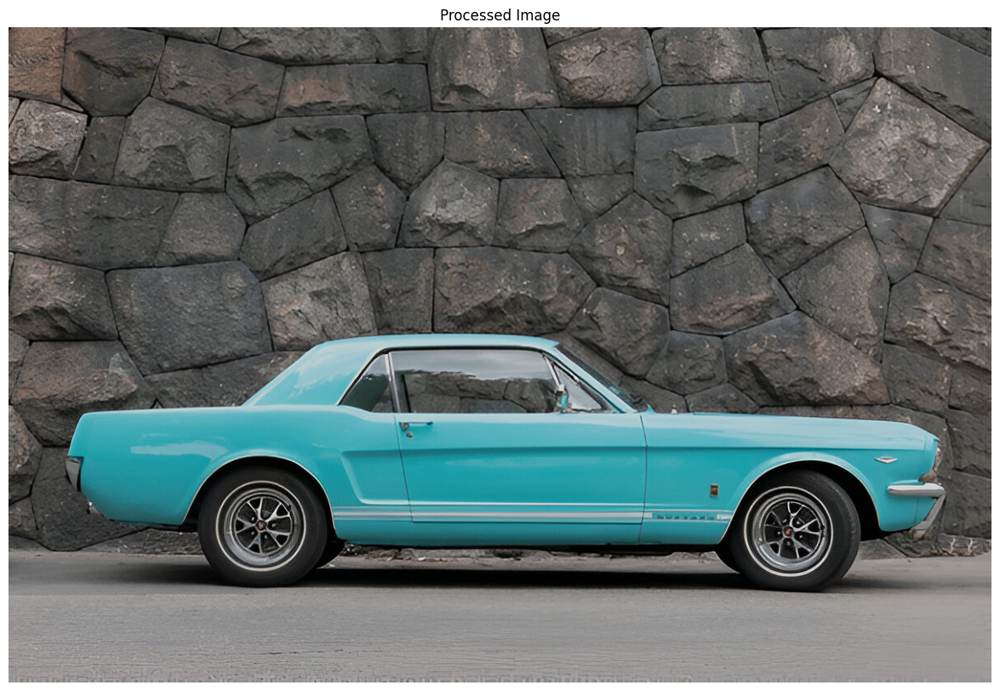

In [ ]:
img = cv2.imread('dat/car_sideview.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# use formula g = f + gamma * (f - f * h)
gamma = 0.001
h = np.ones((5, 5), dtype=np.float32) / 25 
blur = cv2.filter2D(img, -1, h)
g = img * (1- gamma * blur)
g = g / np.max(g) 
# Display the original and processed images
plt.figure(figsize=(20, 10))
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')
plt.figure(figsize=(20, 10))
plt.imshow(g)
plt.title('Processed Image')
plt.axis('off')

**Corner Detection** 

$$
\frac{1}{4} \cdot
\begin{bmatrix}
1 & -2 & 1 \\
-2 & 4 & -2 \\
1 & -2 & 1
\end{bmatrix}
$$


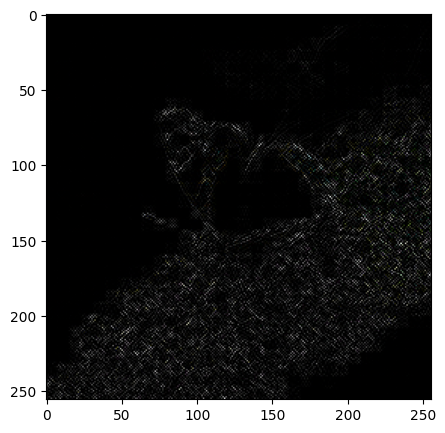

In [ ]:
img = cv2.imread('dat/491.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
ker = np.array([[1,-2,1],[-2,4,-2],[1,-2,1]], dtype=np.float32)/4
# Apply the kernel to the image using convolution
filtered_image = cv2.filter2D(img, -1, ker)
filtered_image = filtered_image / np.max(filtered_image)  # Normalize for display
plt.figure(figsize=(10, 5))
plt.imshow(filtered_image)

**Gaussian Blur Filter** <br>
**Laplacian of Gaussian**

Observation: Gaussian first blurs out the minute details, then Laplacian sharpens the remaining edges.



In [7]:
def Gaussian_kernel(ker_len, sigma):
    from math import pi
    ker = np.zeros((ker_len, ker_len), dtype=np.float32)
    mid = ker_len // 2
    for i in range(ker_len):
        for j in range(ker_len):
            x = i - mid
            y = j - mid
            ker[i, j] = (1 / (2 * pi * sigma**2)) * np.exp(-(x**2 + y**2) / (2 * sigma**2))
    # Normalize the kernel
    ker /= np.sum(ker)
    return ker

def LoG_kernel(ker_len, sigma):
    from math import pi
    ker = np.zeros((ker_len, ker_len), dtype=np.float32)
    mid = ker_len // 2
    for i in range(ker_len):
        for j in range(ker_len):
            x = i - mid
            y = j - mid
            G = (1 / (2 * pi * sigma**2)) * np.exp(-(x**2 + y**2) / (2 * sigma**2))
            L = ((x**2 + y**2)/sigma**4 - 2/(sigma**2))
            ker[i, j] =  G * L 
    # Normalize the kernel
    ker /= np.sum(ker)
    return ker



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4197175862699267..1.0].


[[-1.16600981e-02 -2.61284672e-02  2.11024081e-17  2.61284672e-02
   1.16600981e-02]
 [-5.22569343e-02 -1.17099665e-01  4.72872157e-17  1.17099665e-01
   5.22569343e-02]
 [-8.61571208e-02 -1.93064705e-01  0.00000000e+00  1.93064705e-01
   8.61571208e-02]
 [-5.22569343e-02 -1.17099665e-01 -4.72872157e-17  1.17099665e-01
   5.22569343e-02]
 [-1.16600981e-02 -2.61284672e-02 -2.11024081e-17  2.61284672e-02
   1.16600981e-02]]


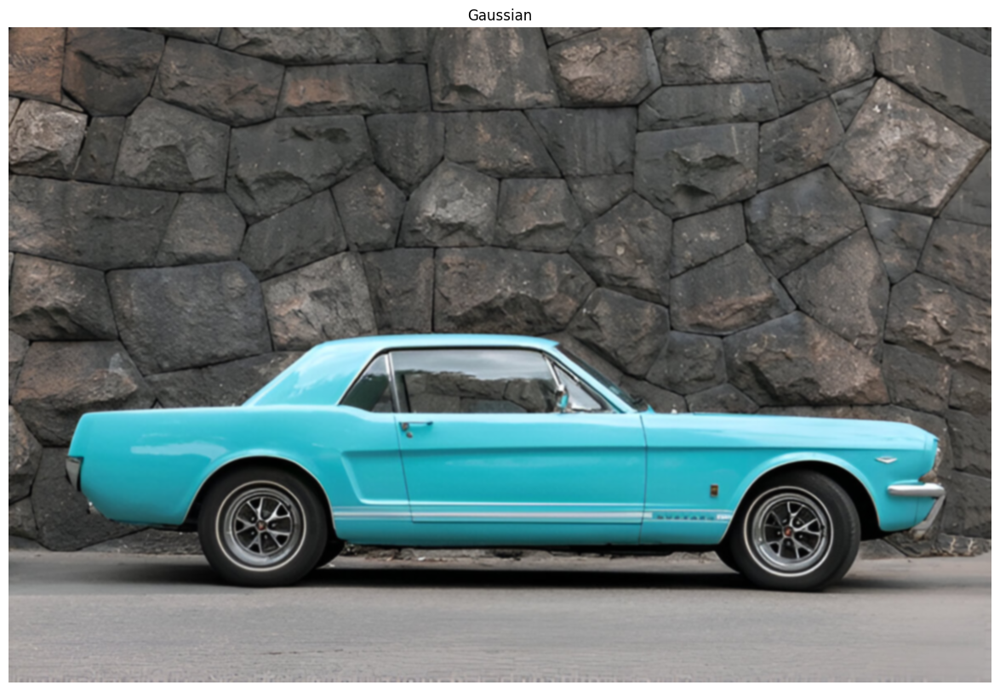

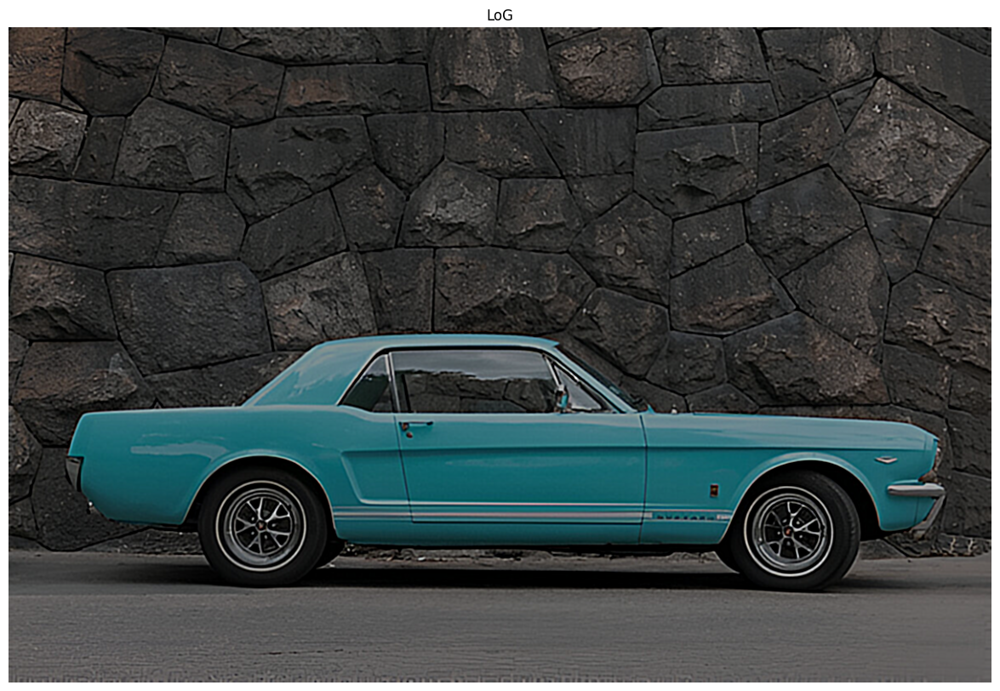

In [ ]:
img = cv2.imread('dat/car_sideview.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = img / 255.0  

sigma = 1.0 
ker_len = 5 # we will keep this odd number for symmetry

#-----------------------------------------------------

G = Gaussian_kernel(ker_len, sigma)
# print("Kernel:\n", ker)
filtered_image = cv2.filter2D(img, -1, G)
filtered_image = filtered_image / np.max(filtered_image)
plt.figure(figsize=(20, 10))
plt.title('Gaussian')
plt.imshow(filtered_image)
plt.axis('off')

#-----------------------------------------------------

LoG = LoG_kernel(ker_len, sigma)
filtered_image = cv2.filter2D(filtered_image, -1, LoG) # apply on the Gauss filtered image
# filtered_image = filtered_image - np.min(filtered_image)  
filtered_image = filtered_image / np.max(filtered_image)
plt.figure(figsize=(20, 10))
plt.title('LoG')
plt.imshow(filtered_image)
plt.axis('off')
print(ker)

In [ ]:
img = cv2.imread('dat/circle.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Convert to grayscale
img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# we will apply steering filter
from math import sin, cos, pi
def create_steering_kernel(theta, size=5, sigma=1.0):
    """
    Create a steering filter kernel at the specified angle theta.
    
    Parameters:
    theta (float): Angle in radians
    size (int): Kernel size (should be odd)
    sigma (float): Sigma for Gaussian
    
    Returns:
    numpy.ndarray: The steering filter kernel
    """
    ker = np.zeros((size, size), dtype=np.float32)
    mid = size // 2
    u = sin(theta)
    v = cos(theta)
    
    for i in range(size):
        for j in range(size):
            x = i - mid
            y = j - mid
            G = (1 / (2 * pi * sigma**2)) * np.exp(-(x**2 + y**2) / (2 * sigma**2))
            ker[i, j] = G * 1/sigma**2 * 2 * (u*x + v*y)
    
    return ker

# Create a list of angles from 0 to 360 degrees
num_angles = 72  # 5-degree increments
angles = np.linspace(0, 360, num_angles) * (pi/180)

# Store filtered images and kernels for each angle
filtered_images = []
all_kernels = []

for theta in angles:
    # Create kernel for this angle
    ker = create_steering_kernel(theta)
    all_kernels.append(ker)
    
    # Apply the kernel
    filtered = cv2.filter2D(img, -1, ker)
    
    # Normalize the image
    filtered = filtered - np.min(filtered)
    filtered = filtered / np.max(filtered)
    
    filtered_images.append(filtered)

# Create animation of filtered images
import matplotlib.animation as animation

fig, ax = plt.subplots(figsize=(10, 10))
plt.axis('off')

# Initialize with the first image
im = ax.imshow(filtered_images[0], cmap='gray')
title = ax.set_title(f'Angle: {angles[0] * 180/pi:.1f}°')

# Function to update the frame
def update_frame(i):
    im.set_data(filtered_images[i])
    title.set_text(f'Angle: {angles[i] * 180/pi:.1f}°')
    return [im, title]

# Create the animation
ani = animation.FuncAnimation(fig, update_frame, frames=num_angles, 
                             interval=100, blit=True)

# Display the animation
plt.tight_layout()
plt.show()

# Save animation
ani.save('results/result_steering_filter.gif', writer='pillow', fps=10)
print("Animation saved as 'results/result_steering_filter.gif'.")
# Create 3D visualization of kernels
from mpl_toolkits.mplot3d import Axes3D

# Create a figure for the 3D kernel animation
fig_3d = plt.figure(figsize=(10, 8))
ax_3d = fig_3d.add_subplot(111, projection='3d')

# Get dimensions of the kernel
kernel_size = all_kernels[0].shape[0]
x = np.arange(0, kernel_size, 1)
y = np.arange(0, kernel_size, 1)
X, Y = np.meshgrid(x, y)

# Find global min/max for consistent z-axis
z_min = min([np.min(kernel) for kernel in all_kernels])
z_max = max([np.max(kernel) for kernel in all_kernels])

# Function to update the 3D frame
def update_3d_frame(i):
    ax_3d.clear()
    surf = ax_3d.plot_surface(X, Y, all_kernels[i], cmap='viridis', edgecolor='none')
    ax_3d.set_title(f'Kernel at Angle: {angles[i] * 180/pi:.1f}°', pad=15)  # Added padding above title
    ax_3d.set_xlabel('X')
    ax_3d.set_ylabel('Y')
    ax_3d.set_zlabel('Value')
    ax_3d.set_zlim(z_min, z_max)
    return [surf]

# Create the 3D animation
ani_3d = animation.FuncAnimation(fig_3d, update_3d_frame, frames=num_angles, 
                                interval=100, blit=False)

# Display the 3D animation
plt.subplots_adjust(top=0.9)  # Add more space at the top
plt.show()

# Save the 3D animation
ani_3d.save('results/result_kernel_3d_animation.gif', writer='pillow', fps=10)
print("3D Kernel animation saved as 'results/result_kernel_3d_animation.gif'.")


<img src="results/result_steering_filter.gif" alt="Local GIF" width="400">
<img src="results/result_kernel_3d_animation.gif" alt="Local GIF" width="500">